# Generating Traing Station Melodies in Japan

In [1]:
train_model = False # Flag training model or not.
evaluate_model = False # Flag evaluating model or not.

## EDA and Data Processing

1. Data processing: inspect the raw audio and rebuild the fixed-length 32 kHz dataset.
2. Augmentation: create background-noise, pitch-shift, and speed-up variants.
3. Visualization: generate quick checks like spectrograms.

In [26]:
from pathlib import Path
import sys
import os
import json
import pickle
import random
import textwrap

import librosa
import librosa.display

import matplotlib.pyplot as plt
import numpy as np
import pandas as pd

from hydra import compose, initialize
from omegaconf import DictConfig, OmegaConf

import tqdm

from google import genai

import torch
import torch.nn as nn
import torch.nn.functional as F

import torchaudio
from torch.utils.data import Dataset, DataLoader

import IPython

# from transformers import T5Tokenizer
# from huggingface_hub import hf_hub_download

# Do not work on MacOS
# from audiocraft.models import MusicGen
# from audiocraft.data.audio import audio_write

# from discrete.text2midi.model.transformer_model import Transformer

sys.path.append(str(Path("src")))

from librosa_audio_utils import configure_logging, duration_samples, find_audio_files, fix_length, load_audio, write_audio
from rebuild_audio_librosa import (
    add_background_noise,
    build_augmentations,
    build_processed_outputs,
    collect_sources,
    compute_target_length,
    pitch_shift_audio,
    time_stretch_audio,
)

### Data Processing

We start from the raw flat WAV files and Dropbox MP3 files, then normalize everything to mono at 32 kHz and a shared integer-second length.

In [3]:
sample_rate = 32000
flat_files, dropbox_files = collect_sources(Path("data/raw/flat"), Path("data/raw/dropbox"))
target_length = compute_target_length(flat_files, dropbox_files, sample_rate)

print(f"flat files: {len(flat_files)}")
print(f"dropbox files: {len(dropbox_files)}")
print(f"target length: {target_length} samples ({target_length / sample_rate:.0f} s)")

# Actual processing step used in the project:
# flat_audio, dropbox_audio = build_processed_outputs(
#     flat_files=flat_files,
#     dropbox_files=dropbox_files,
#     audio_root=Path("data/audio"),
#     sample_rate=sample_rate,
#     target_length=target_length,
# )

raw_summary = pd.DataFrame(
    [
        {"group": "flat", "files": len(flat_files)},
        {"group": "dropbox", "files": len(dropbox_files)},
    ]
)
raw_summary

/opt/homebrew/anaconda3/envs/cse153/lib/python3.12/site-packages/tqdm/auto.py:21: TqdmWarning: IProgress not found. Please update jupyter and ipywidgets. See https://ipywidgets.readthedocs.io/en/stable/user_install.html
  from .autonotebook import tqdm as notebook_tqdm
Note: Illegal Audio-MPEG-Header 0x00000000 at offset 520085.
Note: Trying to resync...
Note: Hit end of (available) data during resync.


flat files: 65
dropbox files: 148
target length: 896000 samples (28 s)


,group,files
0,flat,65
1,dropbox,148


### Augmentation

We used three augmentations to expand the dataset: background noise, pitch shift, and speed up.

In [4]:
audio_path = Path("data/raw/flat/001.wav")
audio = load_audio(audio_path, sample_rate)

# Actual augmentation functions used in the project.
# They match src/rebuild_audio_librosa.py.

def add_background_noise(audio: np.ndarray, noise_db: float, seed: int) -> np.ndarray:
    rng = np.random.default_rng(seed)
    noise = rng.standard_normal(len(audio)).astype(np.float32)
    signal_rms = float(np.sqrt(np.mean(audio**2))) if len(audio) else 0.0
    signal_rms = max(signal_rms, 1e-4)
    noise_rms = signal_rms * (10.0 ** (noise_db / 20.0))
    noise = noise / max(float(np.sqrt(np.mean(noise**2))), 1e-8) * noise_rms
    mixed = audio + noise
    return np.clip(mixed, -1.0, 1.0).astype(np.float32)


def pitch_shift_audio(audio: np.ndarray, sample_rate: int, semitones: float) -> np.ndarray:
    shifted = librosa.effects.pitch_shift(audio, sr=sample_rate, n_steps=semitones)
    return shifted.astype(np.float32, copy=False)


def time_stretch_audio(audio: np.ndarray, rate: float) -> np.ndarray:
    stretched = librosa.effects.time_stretch(audio, rate=rate)
    return stretched.astype(np.float32, copy=False)


noisy = fix_length(add_background_noise(audio, noise_db=-24.0, seed=1), target_length)
shifted = fix_length(pitch_shift_audio(audio, sample_rate, semitones=2.0), target_length)
sped_up = fix_length(time_stretch_audio(audio, rate=1.25), target_length)

print(f"original samples: {len(audio)}")
print(f"noise samples: {len(noisy)}")
print(f"pitch shift samples: {len(shifted)}")
print(f"speed up samples: {len(sped_up)}")

# Actual rebuild call used in the project:
# build_augmentations(
#     audio_sets={"flat": flat_audio, "dropbox": dropbox_audio},
#     audio_root=Path("data/audio"),
#     sample_rate=sample_rate,
#     target_length=target_length,
#     pitch_semitones=2.0,
#     speed_up_rate=1.25,
#     noise_db=-24.0,
# )

original samples: 239360
noise samples: 896000
pitch shift samples: 896000
speed up samples: 896000


### Quick Visual Check

A small spectrogram comparison is enough to confirm the processing and augmentation steps are behaving as expected.

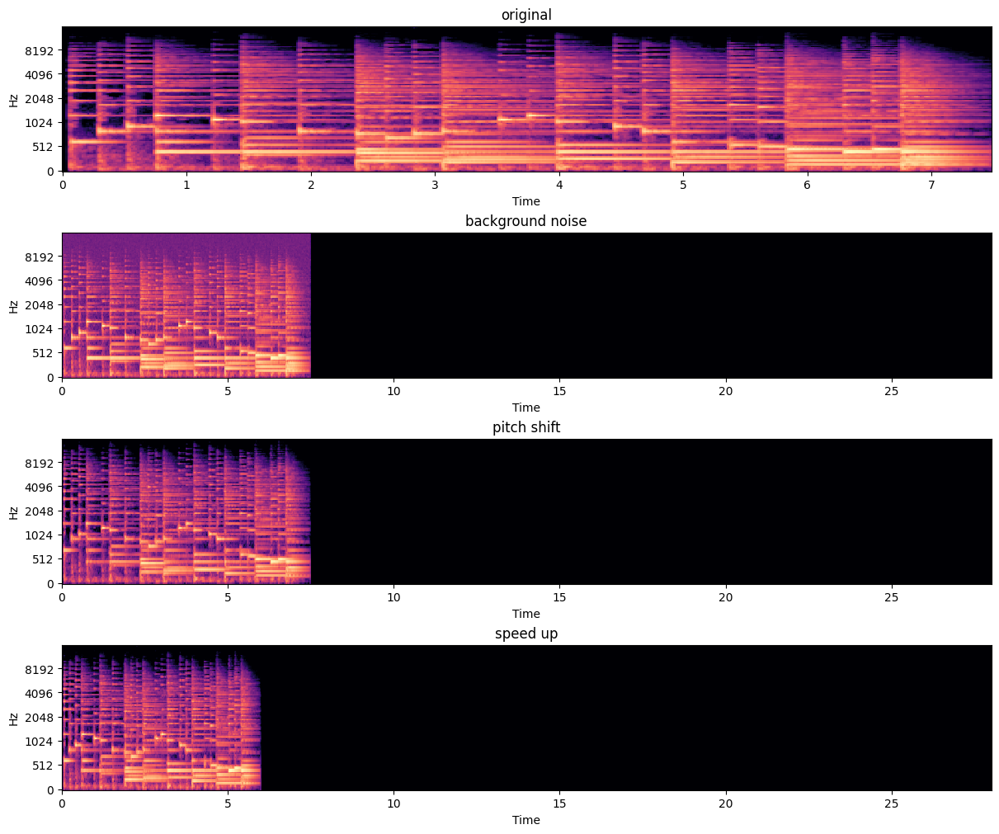

In [5]:
fig, axes = plt.subplots(4, 1, figsize=(12, 10), constrained_layout=True)
examples = [
    (audio, "original"),
    (noisy, "background noise"),
    (shifted, "pitch shift"),
    (sped_up, "speed up"),
]

for ax, (signal, title) in zip(axes, examples):
    mel = librosa.feature.melspectrogram(y=signal, sr=sample_rate, n_fft=2048, hop_length=512, n_mels=128)
    mel_db = librosa.power_to_db(mel, ref=1.0)
    librosa.display.specshow(mel_db, sr=sample_rate, hop_length=512, x_axis="time", y_axis="mel", ax=ax, cmap="magma")
    ax.set_title(title)

plt.show()

### Generating Audio Descriptions with Gemini

In [6]:
def generate_audio_descriptions(prompt, audio_path, desc_path):
    with open("./api.txt", "r") as f:
        api_key = f.read().strip()

    client = genai.Client(api_key=api_key)

    for source in os.listdir(audio_path):
        output_folder = f"{desc_path}/{source}"
        os.makedirs(output_folder, exist_ok=True)

        for name in tqdm.tqdm(os.listdir(f"{audio_path}/{source}")):
            output_name = name.replace(".wav", ".txt")
            output_file = f"{output_folder}/{output_name}"

            if os.path.exists(output_file):
                continue

            audio_file = client.files.upload(file=f"{audio_path}/{source}/{name}")
            response = client.models.generate_content(
                model="gemini-3.5-flash", contents=[prompt, audio_file])

            with open(output_file, "w") as f:
                f.write(response.text)

def generate_new_descriptions(prompt, desc_path, inference_path, n_shots, n_samples):
    descriptions = [f"{source}/{name}" for source in os.listdir(desc_path) for name in os.listdir(f"{desc_path}/{source}")]

    with open("./api.txt", "r") as f:
        api_key = f.read().strip()

    client = genai.Client(api_key=api_key)
    os.makedirs(inference_path, exist_ok=True)

    for i in range(n_samples):
        output_file = f"{inference_path}/{i+1:03d}.txt"
        if os.path.exists(output_file):
            continue

        samples = random.sample(descriptions, n_shots)

        examples = []
        for sample in samples:
            with open(f"{desc_path}/{sample}", "r") as f:
                example = f.read()

            examples.append(example)

        examples = "\n\n".join(examples)
        prompt = examples + "\n\n" + prompt

        response = client.models.generate_content(
            model="gemini-3.5-flash", contents=[prompt])

        with open(output_file, "w") as f:
            f.write(response.text)

In [7]:
with open("./continuous/prompt.txt", "r") as f:
    prompt = f.read()

print(prompt)

Here is a WAV audio file containing a short musical jingle. Please analyze the music and describe the following features:
* the overall mood/emotion
* energy level
* likely instruments used
* genre/style
* melodic characteristics
* rhythmic feel
* harmonic feel (major/minor, tense/calm, etc.)
* overall atmosphere/vibe

The output should be descriptive enough to give people ideas how it would sound like without actually listening to the audio itself and avoid technical audio analysis. The output should be given in the following format:
* described in natural-language rather than bullet points or other formatted structure.
* the length should be around a few sentences to one paragraph long.


In [8]:
audio_path = "./data/audio/processed"
desc_path = "./data/descriptions"

generate_audio_descriptions(prompt, audio_path, desc_path)

inference_path = "./data/inferences"

n_shots = 3
n_samples = 10
prompt = f"Above {n_shots} texts are descriptions of short musical jingles. Based on these examples, generate a new description of a melody. Make sure to write a description which is distinct from examples but follows similar length and structure."

generate_new_descriptions(prompt, desc_path, inference_path, n_shots, n_samples)

evaluation_path = "./evaluation/descriptions"
n_samples = 20
generate_new_descriptions(prompt, desc_path, evaluation_path, n_shots, n_samples)

100%|██████████| 148/148 [00:00<00:00, 127938.37it/s]


## Task 1: Finetuning MusicGen

### Dataset Class

In [9]:

class TrainMelodyDataset(Dataset):
    def __init__(self, cfg):
        self.cfg = cfg
        self.audio_paths, self.texts = self.load_audio_files(cfg)

    def load_audio_files(self, cfg):
        skips = cfg.dataset.get("skips", [])
        folders = [f"{cfg.dataset.path}/processed"]

        for augmentation in cfg.dataset.augmentations:
            if not os.path.exists(f"{cfg.dataset.path}/augmented/{augmentation}"):
                raise NotImplementedError

            folders.append(f"{cfg.dataset.path}/augmented/{augmentation}")

        audio_paths = []
        texts = []
        for folder in folders:
            for source in cfg.dataset.sources:
                for name in os.listdir(f"{folder}/{source}"):
                    if f"{source}/{name}" in skips:
                        continue

                    audio_paths.append(f"{folder}/{source}/{name}")

                    if cfg.dataset.conditions == "default":
                        texts.append(cfg.dataset.default_desc)
                    elif cfg.dataset.conditions == "description":
                        text_name = name.replace(".wav", ".txt")
                        with open(f"{cfg.dataset.description}/{source}/{text_name}", "r") as f:
                            text = f.read()
                        texts.append(text)
                    else:
                        raise NotImplementedError

        return audio_paths, texts

    def __len__(self):
        return len(self.audio_paths)

    def __getitem__(self, idx):
        audio_path = self.audio_paths[idx]
        wav, sr = torchaudio.load(audio_path)

        assert sr == self.cfg.dataset.sample_rate

        return wav, self.texts[idx]

def create_dataloader(cfg):
    dataset = TrainMelodyDataset(cfg)
    dataloader = DataLoader(dataset,
        batch_size=cfg.training.batch_size,
        num_workers=cfg.training.num_workers,
        shuffle=True)

    return dataloader

### Finetuning Procedure

In [10]:
# Credit:
# - https://github.com/junhaopjlab/Musicgen_finetune.git
# - https://github.com/Beinabih/Unconditional-MusicGen-Trainer.git

class MusicGenTrainer():
    def __init__(self, cfg):
        self.cfg = cfg
        self.device = torch.device(cfg.training.device)

        self.model = self.load_model(cfg)
        self.optimizer = self.load_optimizer(cfg)
        self.criterion = nn.CrossEntropyLoss()

    def load_model(self, cfg):
        if cfg.model.name == "musicgen":
            model = MusicGen.get_pretrained(f"facebook/musicgen-{cfg.model.size}", device=self.device)
            model.lm.train()
            model.lm = model.lm.float()

        else:
            raise NotImplementedError

        return model

    def load_optimizer(self, cfg):
        if cfg.training.optimizer == "AdamW":
            optimizer = torch.optim.AdamW(
                self.model.lm.parameters(),
                lr=cfg.training.lr, betas=cfg.training.betas, weight_decay=cfg.training.weight_decay)
        else:
            raise NotImplementedError

        return optimizer

    def train(self, dataloader):
        self.inference(0)

        print("Start finetuning a model")
        for epoch in range(self.cfg.training.num_epochs):
            running_loss = 0.0
            total = 0
            for wav, texts in tqdm.tqdm(dataloader, desc=f"Epoch {epoch+1}"):
                self.optimizer.zero_grad()

                wav = wav.to(self.device)
                with torch.no_grad():
                    codes, scale = self.model.compression_model.encode(wav)

                attributes, _ = self.model._prepare_tokens_and_attributes(texts, prompt=None)
                tokenized = self.model.lm.condition_provider.tokenize(attributes)
                conditions = self.model.lm.condition_provider(tokenized)

                lm_output = self.model.lm.compute_predictions(
                    codes=codes, conditions=[], condition_tensors=conditions)


                logits = lm_output.logits[0]
                mask = lm_output.mask[0].view(-1)

                codes = F.one_hot(codes[0], 2048).float()

                masked_logits = logits.view(-1, 2048)[mask]
                masked_codes = codes.view(-1, 2048)[mask]

                loss = self.criterion(masked_logits, masked_codes)

                running_loss += loss.item() * wav.size(0)
                total += wav.size(0)

                loss.backward()
                self.optimizer.step()

            epoch_loss = running_loss / total

            print(f"[Epoch {epoch+1:2d}] Finished Epoch (loss={epoch_loss:.4f})")
            print(f"[Epoch {epoch+1:2d}] Runninng Inferences")
            self.inference(epoch+1)

            os.makedirs(f"{self.cfg.model.path}/{self.cfg.name}", exist_ok=True)
            torch.save(self.model.lm.state_dict(), f"{self.cfg.model.path}/{self.cfg.name}/{epoch+1}.pth")

        os.makedirs(self.cfg.model.path, exist_ok=True)

    def inference(self, epoch):
        self.model.lm.eval()

        num_samples = self.cfg.inference.num_samples
        for duration in self.cfg.inference.durations:
            self.model.set_generation_params(duration=duration)

            if self.cfg.dataset.conditions == "default":
                texts = [self.cfg.dataset.default_desc for _ in range(num_samples)]
            elif self.cfg.dataset.conditions == "description":
                texts = []
                for file_name in os.listdir(self.cfg.dataset.inference):
                    with open(f"{self.cfg.dataset.inference}/{file_name}", "r") as f:
                        texts.append(f.read())
            else:
                raise NotImplementedError

            with torch.no_grad():
                wavs = self.model.generate(texts)

            os.makedirs(f"{self.cfg.inference.path}/{self.cfg.name}/{epoch}/{duration}", exist_ok=True)
            for idx, wav in enumerate(wavs):
                audio_write(
                    f"{self.cfg.inference.path}/{self.cfg.name}/{epoch}/{duration}/{idx+1:03d}",
                    wav.cpu(), self.model.sample_rate, strategy="loudness", loudness_compressor=True)

        self.model.lm.train()

### Run Conditional Finetuning

In [11]:
with initialize(version_base=None, config_path="./continuous/configs"):
        cfg = compose(config_name="musicgen_medium_conditional")

print("Finetuning Hyperparameters:")
print(json.dumps(OmegaConf.to_container(cfg), indent=4))

if train_model:
    trainer = MusicGenTrainer(cfg)
    trainer.train(dataloader)

Finetuning Hyperparameters:
{
    "name": "musicgen_medium_conditional",
    "model": {
        "name": "musicgen",
        "size": "medium",
        "path": "../models/continuous"
    },
    "dataset": {
        "path": "../data/audio",
        "sample_rate": 32000,
        "sources": [
            "dropbox",
            "flat"
        ],
        "augmentations": [],
        "skips": [
            "dropbox/012.wav",
            "dropbox/013.wav",
            "dropbox/020.wav",
            "dropbox/021.wav",
            "dropbox/022.wav",
            "dropbox/024.wav",
            "dropbox/025.wav",
            "dropbox/026.wav",
            "dropbox/027.wav",
            "dropbox/028.wav",
            "dropbox/029.wav",
            "dropbox/030.wav",
            "dropbox/031.wav",
            "dropbox/032.wav",
            "dropbox/033.wav",
            "dropbox/034.wav",
            "dropbox/069.wav",
            "dropbox/112.wav",
            "dropbox/113.wav",
            "dropbox/

### Run Unconditional Finetuning

In [12]:
with initialize(version_base=None, config_path="./continuous/configs"):
        cfg = compose(config_name="musicgen_medium_null_unconditional")

print("Finetuning Hyperparameters:")
print(json.dumps(OmegaConf.to_container(cfg), indent=4))

if train_model:
    trainer = MusicGenTrainer(cfg)
    trainer.train(dataloader)

Finetuning Hyperparameters:
{
    "name": "musicgen_medium_null_unconditional",
    "model": {
        "name": "musicgen",
        "size": "medium",
        "path": "../models/continuous"
    },
    "dataset": {
        "path": "../data/audio",
        "sample_rate": 32000,
        "sources": [
            "dropbox",
            "flat"
        ],
        "augmentations": [],
        "skips": [
            "dropbox/012.wav",
            "dropbox/013.wav",
            "dropbox/020.wav",
            "dropbox/021.wav",
            "dropbox/022.wav",
            "dropbox/024.wav",
            "dropbox/025.wav",
            "dropbox/026.wav",
            "dropbox/027.wav",
            "dropbox/028.wav",
            "dropbox/029.wav",
            "dropbox/030.wav",
            "dropbox/031.wav",
            "dropbox/032.wav",
            "dropbox/033.wav",
            "dropbox/034.wav",
            "dropbox/069.wav",
            "dropbox/112.wav",
            "dropbox/113.wav",
            "d

## Task 2: Finetune Text2Midi

### Dataset Class

In [13]:
class TrainMelodyDataset(Dataset):
    def __init__(self, cfg):
        self.cfg = cfg
        self.max_audio_len = cfg.dataset.max_audio_len
        self.max_text_len = cfg.dataset.max_text_len

        self.midi_paths, self.texts = self.load_midi_files(cfg)

        self.text_tokenizer = T5Tokenizer.from_pretrained("google/flan-t5-base")

        repo_id = "amaai-lab/text2midi"
        tokenizer_path = hf_hub_download(repo_id=repo_id, filename="vocab_remi.pkl")
        with open(tokenizer_path, "rb") as f:
            self.audio_tokenizer = pickle.load(f)

    def load_midi_files(self, cfg):
        skips = cfg.dataset.get("skips", [])

        midi_paths = []
        texts = []
        for source in cfg.dataset.sources:
            for name in os.listdir(f"{cfg.dataset.path}/{source}"):
                if f"{source}/{name}" in skips:
                    continue

                midi_paths.append(f"{cfg.dataset.path}/{source}/{name}")

                if cfg.dataset.conditions == "default":
                    texts.append(cfg.dataset.default_desc)
                elif cfg.dataset.conditions == "description":
                    text_name = name.replace(".mid", ".txt")
                    with open(f"{cfg.dataset.description}/{source}/{text_name}", "r") as f:
                        text = f.read()
                    texts.append(text)
                else:
                    raise NotImplementedError

        return midi_paths, texts

    def __len__(self):
        return len(self.midi_paths)

    def __getitem__(self, idx):
        midi_path = self.midi_paths[idx]
        events = [1] + self.audio_tokenizer.encode(midi_path).ids
        events = torch.tensor(events, dtype=torch.long)

        tgt_input_pad = self.max_audio_len - events.size(0)
        tgt_input = F.pad(events, pad=(0, tgt_input_pad))

        tgt_output_pad = self.max_audio_len - events.size(0) + 1
        tgt_output = F.pad(events[1:], pad=(0, tgt_output_pad))

        text = self.texts[idx]
        text = self.text_tokenizer(text, return_tensors="pt", padding=True, truncation=True)
        src = text.input_ids.squeeze()
        mask = text.attention_mask.squeeze()

        src_input_pad = self.max_text_len - src.size(0)
        src_input = F.pad(src, pad=(0, src_input_pad))
        src_mask = F.pad(mask, pad=(0, src_input_pad))

        return src_input, src_mask, tgt_input, tgt_output

def load_test_data(cfg):
    text_tokenizer = T5Tokenizer.from_pretrained("google/flan-t5-base")

    if cfg.dataset.conditions == "default":
        num_samples = cfg.inference.num_samples
        texts = [cfg.dataset.default_desc for _ in range(num_samples)]
    elif cfg.dataset.conditions == "description":
        texts = []
        for file_name in os.listdir(cfg.dataset.inference):
            with open(f"{cfg.dataset.inference}/{file_name}", "r") as f:
                texts.append(f.read())
    else:
        raise NotImplementedError

    texts = text_tokenizer(texts, return_tensors="pt", padding=True, truncation=True)
    src = texts.input_ids
    mask = texts.attention_mask

    src_input_pad = cfg.dataset.max_text_len - src.size(0)
    src_input = F.pad(src, pad=(0, src_input_pad))
    src_mask = F.pad(mask, pad=(0, src_input_pad))

    return src_input, src_mask

def create_dataloader(cfg):
    dataset = TrainMelodyDataset(cfg)
    dataloader = DataLoader(dataset,
        batch_size=cfg.training.batch_size,
        num_workers=cfg.training.num_workers,
        shuffle=True)

    return dataloader

### Finetuning Procedure

In [14]:
class Text2MidiTrainer():
    def __init__(self, cfg):
        self.cfg = cfg
        self.device = torch.device(cfg.training.device)

        self.model, self.audio_tokenizer = self.load_model(cfg)
        self.optimizer = self.load_optimizer(cfg)
        self.criterion = nn.CrossEntropyLoss(reduction="sum")

    def load_model(self, cfg):
        if cfg.model.name == "text2midi":
            repo_id = "amaai-lab/text2midi"
            model_path = hf_hub_download(repo_id=repo_id, filename="pytorch_model.bin")
            tokenizer_path = hf_hub_download(repo_id=repo_id, filename="vocab_remi.pkl")

            with open(tokenizer_path, "rb") as f:
                audio_tokenizer = pickle.load(f)

            vocab_size = len(audio_tokenizer)
            model = Transformer(vocab_size, 768, 8, 2048, 18, 1024, False, 8, device=self.device)
            model.load_state_dict(torch.load(model_path, map_location=self.device))

        else:
            raise NotImplementedError

        return model, audio_tokenizer

    def load_optimizer(self, cfg):
        if cfg.training.optimizer == "AdamW":
            optimizer = torch.optim.AdamW(
                self.model.parameters(),
                lr=cfg.training.lr, betas=cfg.training.betas, weight_decay=cfg.training.weight_decay)
        else:
            raise NotImplementedError

        return optimizer

    def train(self, dataloader):
        self.inference(0)

        print("Start finetuning a model")
        for epoch in range(self.cfg.training.num_epochs):
            running_loss = 0.0
            total = 0
            for (src_inputs, src_masks, tgt_inputs, tgt_outputs) in tqdm.tqdm(dataloader, desc=f"Epoch {epoch+1}"):
                self.optimizer.zero_grad()

                src_inputs = src_inputs.to(self.device)
                src_masks = src_masks.to(self.device)
                tgt_inputs = tgt_inputs.to(self.device)
                tgt_outputs = tgt_outputs.to(self.device)

                outputs = self.model(
                    src=src_inputs, src_mask=src_masks,
                    tgt=tgt_inputs, tgt_is_causal=True)

                vocab_size = outputs.size(-1)
                outputs = outputs.reshape(-1, vocab_size)
                tgt_outputs = tgt_outputs.reshape(-1)

                loss = self.criterion(outputs, tgt_outputs)

                running_loss += loss.item()
                total += src_inputs.size(0)

                loss.backward()
                self.optimizer.step()

            epoch_loss = running_loss / (total * self.cfg.dataset.max_audio_len)

            print(f"[Epoch {epoch+1:2d}] Finished Epoch (loss={epoch_loss:.4f})")
            print(f"[Epoch {epoch+1:2d}] Runninng Inferences")

            if (epoch + 1) % 10 == 0:
                os.makedirs(f"{self.cfg.model.path}/{self.cfg.name}", exist_ok=True)
                torch.save(self.model.state_dict(), f"{self.cfg.model.path}/{self.cfg.name}/{epoch+1}.pth")
                self.inference(epoch+1)

        os.makedirs(self.cfg.model.path, exist_ok=True)

    def inference(self, epoch):
        self.model.eval()

        output_path = f"{self.cfg.inference.path}/{self.cfg.name}/{epoch}"
        os.makedirs(output_path, exist_ok=True)

        src_inputs, src_masks = load_test_data(self.cfg)
        src_inputs = src_inputs.to(self.device)
        src_masks = src_masks.to(self.device)

        with torch.no_grad():
            outputs = self.model.generate(src_inputs, src_masks, max_len=self.cfg.inference.output_len)

        for idx in range(outputs.size(0)):
            output_list = outputs[idx].tolist()
            generated_midi = self.audio_tokenizer.decode(output_list)
            generated_midi.dump_midi(f"{output_path}/{idx+1:03d}.mid")

        self.model.train()


In [15]:
with initialize(version_base=None, config_path="./discrete/configs"):
        cfg = compose(config_name="text2midi_conditional")

print("Finetuning Hyperparameters:")
print(json.dumps(OmegaConf.to_container(cfg), indent=4))

if train_model:
    trainer = Text2MidiTrainer(cfg)
    trainer.train(dataloader)

Finetuning Hyperparameters:
{
    "name": "text2midi_conditional",
    "model": {
        "name": "text2midi",
        "path": "../models/discrete"
    },
    "dataset": {
        "path": "../data/midi",
        "max_audio_len": 1340,
        "max_text_len": 250,
        "sources": [
            "dropbox",
            "flat"
        ],
        "augmentations": [],
        "skips": [
            "dropbox/012.mid",
            "dropbox/013.mid",
            "dropbox/020.mid",
            "dropbox/021.mid",
            "dropbox/022.mid",
            "dropbox/024.mid",
            "dropbox/025.mid",
            "dropbox/026.mid",
            "dropbox/027.mid",
            "dropbox/028.mid",
            "dropbox/029.mid",
            "dropbox/030.mid",
            "dropbox/031.mid",
            "dropbox/032.mid",
            "dropbox/033.mid",
            "dropbox/034.mid",
            "dropbox/069.mid",
            "dropbox/112.mid",
            "dropbox/113.mid",
            "dropbox/114.

## Evaluation

### Sampling Precedures

In [16]:
# Credit:
class MusicGenSampler():
    def __init__(self, cfg):
        self.cfg = cfg
        self.device = torch.device(cfg.model.device)
        self.conditional_model, self.unconditional_model, self.pretrained_model = self.load_model(cfg)

    def load_model(self, cfg):
        if cfg.model.name == "musicgen":
            conditional_model = MusicGen.get_pretrained(f"facebook/musicgen-{cfg.model.size}")
            state_dict = torch.load(f"{cfg.model.conditional}/{cfg.model.best_epoch}.pth")
            conditional_model.lm.load_state_dict(state_dict)
            conditional_model.lm.eval()

            unconditional_model = MusicGen.get_pretrained(f"facebook/musicgen-{cfg.model.size}")
            state_dict = torch.load(f"{cfg.model.unconditional}/{cfg.model.best_epoch}.pth")
            unconditional_model.lm.load_state_dict(state_dict)
            unconditional_model.lm.eval()

            pretraiend_model = MusicGen.get_pretrained(f"facebook/musicgen-{cfg.model.size}")
            pretraiend_model.lm.eval()

        else:
            raise NotImplementedError

        return conditional_model, unconditional_model, pretraiend_model

    def sample(self):
        texts = []
        for file_name in os.listdir(f"{self.cfg.evaluation.path}/descriptions"):
            with open(f"{self.cfg.evaluation.path}/descriptions/{file_name}", "r") as f:
                texts.append(f.read())

        num_samples = self.cfg.evaluation.num_samples

        models = [
            (self.pretrained_model, "pretrained"),
            (self.conditional_model, "conditional"),
            (self.unconditional_model, "unconditional")]

        for model, model_name in models:
            print(f"Running inference with {model_name}")
            if model_name == "unconditional":
                texts = ["" for _ in texts]

            self.inference(model, model_name, texts, num_samples)

    def inference(self, model, model_name, texts, num_samples):
        output_path = f"{self.cfg.evaluation.path}/{model_name}"
        os.makedirs(output_path, exist_ok=True)

        if len(os.listdir(output_path)) == num_samples:
            return

        model.lm = model.lm.to(self.device)
        model.set_generation_params(duration=self.cfg.evaluation.duration)

        with torch.no_grad():
            wavs = model.generate(texts)

        for idx, wav in enumerate(wavs):
            audio_write(f"{output_path}/{idx+1:03d}", wav.cpu(), model.sample_rate,
                strategy="loudness", loudness_compressor=True)

        model.lm.cpu()


### Running Evaluations

In [17]:
def create_evaluation_sets(cfg):
    user_test_path = f"{cfg.evaluation.path}/user_test"

    references = []
    for i in range(cfg.evaluation.num_samples):
        folder = f"{user_test_path}/sample{i+1}"
        os.makedirs(folder, exist_ok=True)

        conditional_source = f"{cfg.evaluation.path}/conditional/{i+1:03d}.wav"
        unconditional_source = f"{cfg.evaluation.path}/unconditional/{i+1:03d}.wav"
        pretrained_source = f"{cfg.evaluation.path}/pretrained/{i+1:03d}.wav"

        desc_source = f"{cfg.evaluation.path}/descriptions/{i+1:03d}.txt"
        desc_dest = f"{user_test_path}/sample{i+1}/prompt.txt"

        indices = list(range(3))
        random.shuffle(indices)

        conditional_dest = f"{user_test_path}/sample{i+1}/melody{indices[0]+1}.wav"
        unconditional_dest = f"{user_test_path}/sample{i+1}/melody{indices[1]+1}.wav"
        pretrained_dest = f"{user_test_path}/sample{i+1}/melody{indices[2]+1}.wav"

        reference = ["", "", ""]
        reference[indices[0]] = "conditional"
        reference[indices[1]] = "unconditional"
        reference[indices[2]] = "pretrained"
        references.append([i+1] + reference)

        shutil.copyfile(conditional_source, conditional_dest)
        shutil.copyfile(unconditional_source, unconditional_dest)
        shutil.copyfile(pretrained_source, pretrained_dest)
        shutil.copyfile(desc_source, desc_dest)

    references = pd.DataFrame(references, columns=["sample", "melody1", "melody2", "melody3"])
    references.to_csv(f"{cfg.evaluation.path}/user_test_references.csv", index=False)

    forms = [[i+1, "", "", "", "", "", "", ""] for i in range(references.shape[0])]

    columns = ["sample", "best",
        "melody1_jingle", "melody1_quality",
        "melody2_jingle", "melody2_quality",
        "melody3_jingle", "melody3_quality",
    ]
    forms = pd.DataFrame(forms, columns=columns)

    forms.to_csv(f"{user_test_path}/forms.csv", index=False)

    question = "First, please listen to 5 examples of train jingle audios in examples, which are used in actual train stations. Then, please evaluate how each melody melody sounds like a jingle in train station in 1 to 5 scale and how each melody sounds good in terms of quality in 1 to 5 scale. Finally decide which one is sounds better overall in the context of playing them in public transportation in forms.csv. Finally, choose the best melody from 60 samples in best_melody.txt. (example: 'sample 4, melody: 2')"

    with open(f"{user_test_path}/question.txt", "w") as f:
        f.write(question)

    with open(f"{user_test_path}/best_melody.txt", "w") as f:
        f.write("sample: [], melody: []")

    os.makedirs(f"{user_test_path}/examples", exist_ok=True)
    for i, example in enumerate(cfg.evaluation.examples):
        shutil.copyfile(example, f"{user_test_path}/examples/example{i+1}.wav")

In [18]:
with initialize(version_base=None, config_path="./continuous/configs"):
        cfg = compose(config_name="evaluation")

print("Evaluation Hyperparameters:")
print(json.dumps(OmegaConf.to_container(cfg), indent=4))

if evaluate_model:
    sampler = MusicGenSampler(cfg)
    sampler.sample()
    create_evaluation_sets(cfg)

Evaluation Hyperparameters:
{
    "name": "musicgen_medium_conditional_augmentations",
    "model": {
        "name": "musicgen",
        "size": "medium",
        "best_epoch": 4,
        "conditional": "../models/continuous/musicgen_medium_conditional",
        "unconditional": "../models/continuous/musicgen_medium_null_unconditional",
        "device": "cuda"
    },
    "evaluation": {
        "path": "../evaluation",
        "num_samples": 20,
        "duration": 20,
        "examples": [
            "../data/audio/processed/dropbox/004.wav",
            "../data/audio/processed/dropbox/099.wav",
            "../data/audio/processed/dropbox/112.wav",
            "../data/audio/processed/flat/008.wav",
            "../data/audio/processed/flat/028.wav"
        ]
    }
}


## Results

### Human Evaluations

In [19]:
###

### Generation Samples

#### Conditioned Generation Samples

In [ ]:
eval_path = "./evaluation/conditional"
samples = random.sample(os.listdir(eval_path), 5)
for sample in samples:
    text_path = f"./evaluation/descriptions/{sample.replace(".wav", ".txt")}"
    with open(text_path, "r") as f:
        prompt = "\n".join(textwrap.wrap(f.read(), 50))
        print(f"Prompt:\n{prompt}")

    audio_path = f"{eval_path}/{sample}"
    IPython.display.display(IPython.display.Audio(audio_path))

Prompt:
['This cozy and charming acoustic jingle radiates a', 'warm, hand-crafted, and carefree emotion, making', 'it the perfect introduction for a lifestyle', 'podcast, a DIY craft channel, or a wholesome', 'family brand. Characterized by the gentle,', 'rhythmic strumming of a ukulele, soft acoustic', 'guitar plucks, and a light shaker, the track', 'carries a low-to-medium energy that feels', 'intimately organic. A cheerful, whistled melody', 'takes center stage, skipping playfully along a', 'simple, comforting major chord progression that', 'instantly puts the listener at ease. The rhythm is', 'breezy and relaxed, swaying with a gentle, swing-', 'like lilt that moves forward without any rush.', 'Overall, the atmosphere is incredibly inviting,', 'sunny, and down-to-earth, leaving behind a', 'lingering sense of simple joy and sweet nostalgia.']


Prompt:
['This warm and inviting musical jingle blends', 'organic acoustic elements with modern digital', 'textures, creating a friendly, human-centric', 'atmosphere that would perfectly suit a lifestyle', 'app, a creative platform, or an eco-friendly brand', 'logo. Carrying a gentle, low-to-medium energy, the', 'track opens with the bright, natural pluck of an', 'acoustic guitar, which is quickly joined by a', 'soft, pulsing digital marimba and a subtle, warm', 'synthesizer swell. The melody is simple,', 'wholesome, and highly memorable, featuring a', 'brief, three-note ascending motif in a comforting', 'major key that floats over a relaxed, organic', 'percussion tap. It resolves gracefully on a soft,', 'resonant acoustic chord, leaving a lingering', 'feeling of trust, clarity, and down-to-earth', 'optimism that makes the listener feel instantly at', 'ease.']


Prompt:
['This sunny and organic musical jingle exudes a', 'carefree, rustic, and heartwarming mood, carrying', 'a gentle, medium-paced energy that is perfect for', 'a cozy lifestyle vlog introduction or a crafty DIY', 'brand logo. Driven by the bright, rhythmic', 'strumming of an acoustic ukulele, the track', 'features a playful, whistled melody that hops', 'along a simple, happy scale. The harmonic backdrop', 'is entirely major and comforting, supported by the', 'soft, earthy pulse of handclaps and a subtle', 'shaker that keeps the rhythm light and bouncy.', 'With its minimalist, hand-crafted aesthetic, the', 'piece wraps up with a single, ringing acoustic', 'chord, leaving the listener with a feeling of', 'pure, simple joy and creative inspiration.']


Prompt:
['This sunny and organic musical jingle radiates a', 'carefree, rustic charm with a lighthearted and', 'thoroughly optimistic mood. Anchored by the', 'bright, rhythmic strumming of an acoustic ukulele,', 'the piece instantly introduces a cheerful, human', 'whistling melody that is both breezy and', 'effortlessly catchy. Accompanied by the gentle,', 'steady patter of soft handclaps and a warm, plucky', 'acoustic bass, the rhythm has a playful, swinging', 'bounce that moves with natural ease. Harmonically,', 'the tune is set in a pure, joyful major key,', 'completely free of tension and ending on a sweet,', 'sustained ukulele strum that slowly fades. With', 'its warm, wholesome, and lively acoustic feel,', 'this brief track creates a down-to-earth,', 'welcoming atmosphere, making it the perfect fit', 'for a DIY crafting tutorial, a cozy travel vlog', 'intro, or a friendly, artisanal brand logo.']


Prompt:
['This sophisticated and whimsical musical jingle', 'carries a lighthearted, cinematic vibe, evoking', 'the playful curiosity of a prestige animation', 'short or a high-end nature documentary. It opens', 'with the crisp, dancing pluck of orchestral', 'pizzicato strings, which are quickly joined by the', 'sparkling, magical counter-melody of a celesta.', 'The energy is gently buoyant and mid-tempo, driven', 'by a tiptoeing rhythm that feels both elegant and', 'mischievous. Harmonically, the piece rests in a', 'bright, inquisitive major key, while a brief,', 'playful woodwind swell adds a touch of organic', 'warmth and clever sophistication. Resolving on a', 'clean, ringing triangle chime and a soft,', 'sustained string chord, the jingle leaves a', 'lasting impression of clever discovery, elegance,', 'and joyful anticipation.']


#### Unconditioned Generation Samples

In [21]:
eval_path = "./evaluation/unconditional"
samples = random.sample(os.listdir(eval_path), 5)
for sample in samples:
    path = f"{eval_path}/{sample}"
    IPython.display.display(IPython.display.Audio(path))